In [8]:
import os
os.chdir("../../")

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
import pandas as pd
import scanpy as sc
import scnet as sn
import numpy as np
import seaborn as sns
from sklearn.neighbors import KNeighborsTransformer, DistanceMetric

Using TensorFlow backend.


In [4]:
adata = sc.read("./data/tabula_senis_normalized_all_hvg.h5ad")

In [7]:
adata[adata.obs['tissue'] == 'Trachea']

View of AnnData object with n_obs × n_vars = 11136 × 5000 
    obs: 'FACS.selection', 'age', 'batch', 'cell', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'method', 'mouse.id', 'n_counts', 'n_genes', 'sex', 'subtissue', 'tissue', 'tissue_free_annotation', 'method_tissue', 'method_age', 'Tech'
    var: 'n_cells-0', 'n_cells-1', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'

In [4]:
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

In [5]:
sc.settings.set_figure_params(dpi=100)
sc.settings.figdir = "./results/integration/tabula_senis_mca/"

In [6]:
condition_key = "method_age"
cell_type_key = 'cell_type_union'
target_conditions = ["Microwell-mix", "droplet - 3m", "facs - 3m"]

# Loading Tabula Senis datasets and data preparation

In [7]:
base_path = "/media/pgdrive/sharif/exosomians/mohsen/data/"

In [8]:
adata = sc.read(os.path.join(base_path, "./tabula_senis_mca/tabula_senis_mca_new_label_consistent_celltype_filtered_normalized_all_hvg.h5ad"))
adata

AnnData object with n_obs × n_vars = 283811 × 5000 
    obs: 'FACS.selection', 'Tech', 'age', 'barcode', 'batch', 'cell', 'cell_ontology_class', 'cell_ontology_id', 'cell_type', 'cell_type_union', 'channel', 'free_annotation', 'log_counts', 'marker_gene', 'method', 'method_age', 'method_tissue', 'mouse.id', 'n_counts', 'n_genes', 'old_tissue', 'percent_mito', 'sample', 'sample_id', 'sex', 'size_factors', 'study', 'subtissue', 'tissue', 'tissue_age', 'tissue_free_annotation'
    var: 'n_cells-0-1-0-0', 'n_cells-1-1-0-0', 'highly_variable-1-0-0', 'means-1-0-0', 'dispersions-1-0-0', 'dispersions_norm-1-0-0', 'highly_variable_nbatches-1-0-0', 'highly_variable_intersection-1-0-0', 'gene_ids-1-1-1-0', 'n_cells-0-1-1', 'n_cells-1-1-1', 'n_cells-0-1-2', 'n_cells-1-1-2'

In [9]:
source_adata = adata[~adata.obs[condition_key].isin(target_conditions)]
source_adata

View of AnnData object with n_obs × n_vars = 169425 × 5000 
    obs: 'FACS.selection', 'Tech', 'age', 'barcode', 'batch', 'cell', 'cell_ontology_class', 'cell_ontology_id', 'cell_type', 'cell_type_union', 'channel', 'free_annotation', 'log_counts', 'marker_gene', 'method', 'method_age', 'method_tissue', 'mouse.id', 'n_counts', 'n_genes', 'old_tissue', 'percent_mito', 'sample', 'sample_id', 'sex', 'size_factors', 'study', 'subtissue', 'tissue', 'tissue_age', 'tissue_free_annotation'
    var: 'n_cells-0-1-0-0', 'n_cells-1-1-0-0', 'highly_variable-1-0-0', 'means-1-0-0', 'dispersions-1-0-0', 'dispersions_norm-1-0-0', 'highly_variable_nbatches-1-0-0', 'highly_variable_intersection-1-0-0', 'gene_ids-1-1-1-0', 'n_cells-0-1-1', 'n_cells-1-1-1', 'n_cells-0-1-2', 'n_cells-1-1-2'

In [10]:
target_adata = adata[adata.obs[condition_key].isin(target_conditions)]
target_adata

View of AnnData object with n_obs × n_vars = 114386 × 5000 
    obs: 'FACS.selection', 'Tech', 'age', 'barcode', 'batch', 'cell', 'cell_ontology_class', 'cell_ontology_id', 'cell_type', 'cell_type_union', 'channel', 'free_annotation', 'log_counts', 'marker_gene', 'method', 'method_age', 'method_tissue', 'mouse.id', 'n_counts', 'n_genes', 'old_tissue', 'percent_mito', 'sample', 'sample_id', 'sex', 'size_factors', 'study', 'subtissue', 'tissue', 'tissue_age', 'tissue_free_annotation'
    var: 'n_cells-0-1-0-0', 'n_cells-1-1-0-0', 'highly_variable-1-0-0', 'means-1-0-0', 'dispersions-1-0-0', 'dispersions_norm-1-0-0', 'highly_variable_nbatches-1-0-0', 'highly_variable_intersection-1-0-0', 'gene_ids-1-1-1-0', 'n_cells-0-1-1', 'n_cells-1-1-1', 'n_cells-0-1-2', 'n_cells-1-1-2'

In [11]:
source_adata.obs['Tech'].value_counts()

Tabula Senis    169425
Name: Tech, dtype: int64

In [12]:
target_adata.obs['Tech'].value_counts()

MCA             71259
Tabula Muris    43127
Name: Tech, dtype: int64

## Train/Test Split

In [13]:
train_adata, valid_adata = sn.utils.train_test_split(source_adata, 0.80)

In [14]:
train_adata.shape, valid_adata.shape

((135540, 5000), (33885, 5000))

In [15]:
n_conditions = len(train_adata.obs[condition_key].unique().tolist())
n_conditions

7

# Create & Train model with training data

In [16]:
network = sn.archs.scNet(x_dimension=train_adata.shape[1], 
                         z_dimension=40,
                         architecture=[128, 32],
                         n_conditions=n_conditions,
                         use_batchnorm=False,
                         lr=0.001,
                         alpha=0.0001,
                         beta=50,
                         eta=1000,
                         clip_value=100000,
                         loss_fn='mse',
                         mmd_computation_method='5',
                         model_path="./models/CVAE/tabula_senis_mca/before/",
                         dropout_rate=0.05,
                         output_activation='relu')

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


## We assign each study to a numerical label 

In [17]:
train_adata.obs[condition_key].value_counts()

droplet - 30m    35413
droplet - 18m    21672
droplet - 24m    19790
droplet - 21m    17116
facs - 18m       16107
facs - 24m       13640
droplet - 1m     11802
Name: method_age, dtype: int64

In [18]:
conditions = adata.obs[condition_key].unique().tolist()
condition_encoder = sn.utils.create_dictionary(sorted(conditions), target_conditions)
condition_encoder

{'droplet - 18m': 0,
 'droplet - 1m': 1,
 'droplet - 21m': 2,
 'droplet - 24m': 3,
 'droplet - 30m': 4,
 'facs - 18m': 5,
 'facs - 24m': 6}

## Training the network

In [ ]:
network.train(train_adata,
              valid_adata, 
              condition_key=condition_key,
              le=condition_encoder, 
              n_epochs=1000,
              n_per_epoch=0,
              batch_size=512, 
              early_stop_limit=20,
              lr_reducer=10, 
              save=True, 
              retrain=False,
              verbose=5)

In [ ]:
network.condition_encoder

In [ ]:
plot_adata = sc.pp.subsample(source_adata, n_obs=50000, copy=True)

In [ ]:
encoder_labels, _ = sn.utils.label_encoder(
    plot_adata, label_encoder=network.condition_encoder, condition_key=condition_key)

In [ ]:
latent_adata = network.to_mmd_layer(plot_adata, encoder_labels, encoder_labels)
latent_adata

In [ ]:
sc.pp.neighbors(latent_adata)
sc.tl.umap(latent_adata)

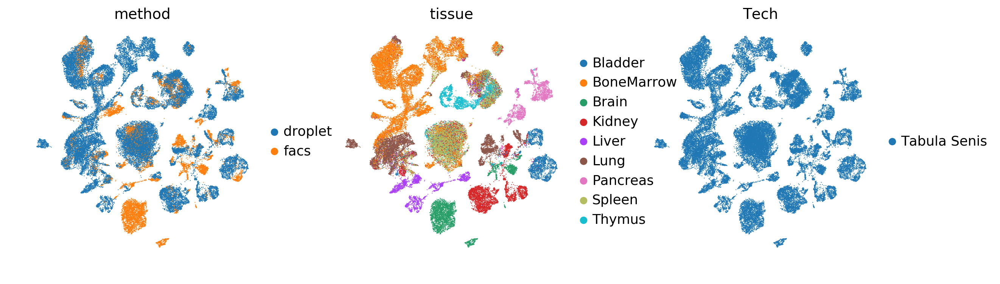

In [33]:
sc.pl.umap(latent_adata, color=['method', 'tissue', 'Tech'], frameon=False)

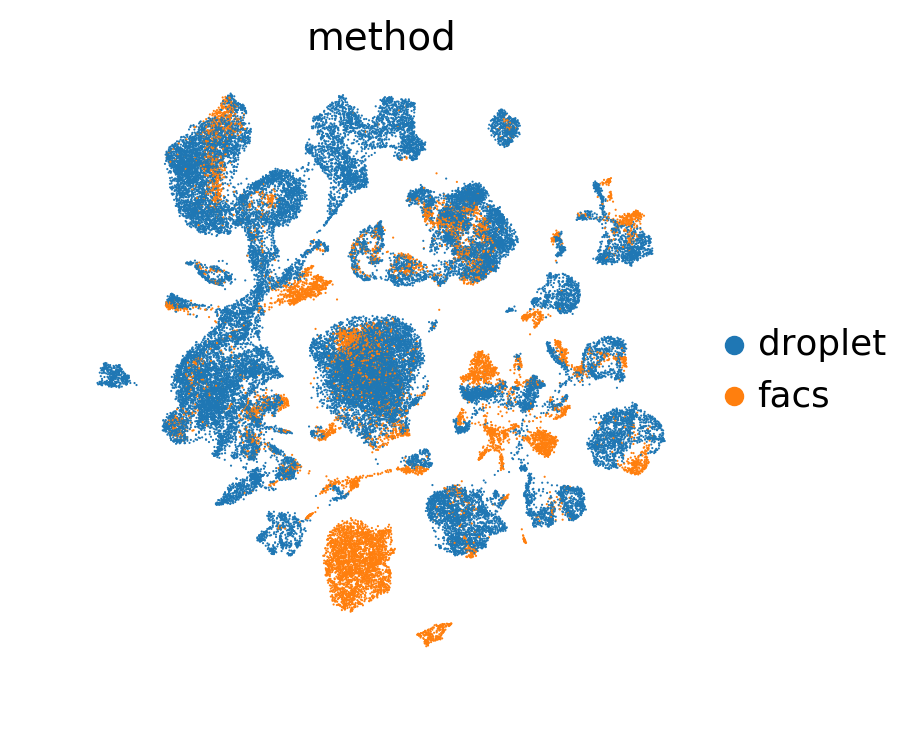

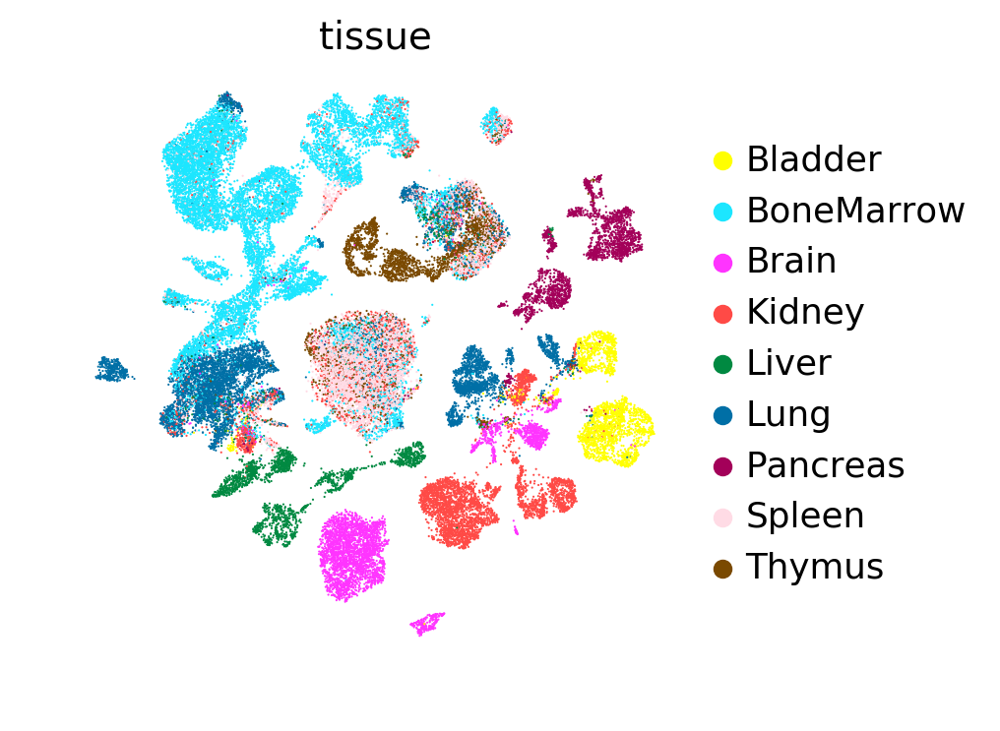

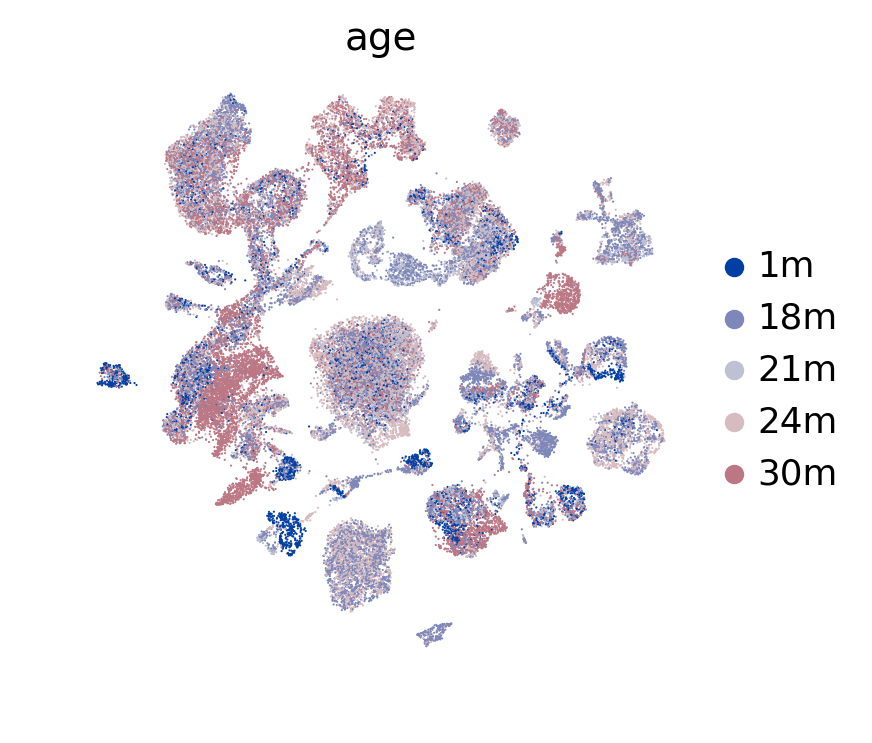

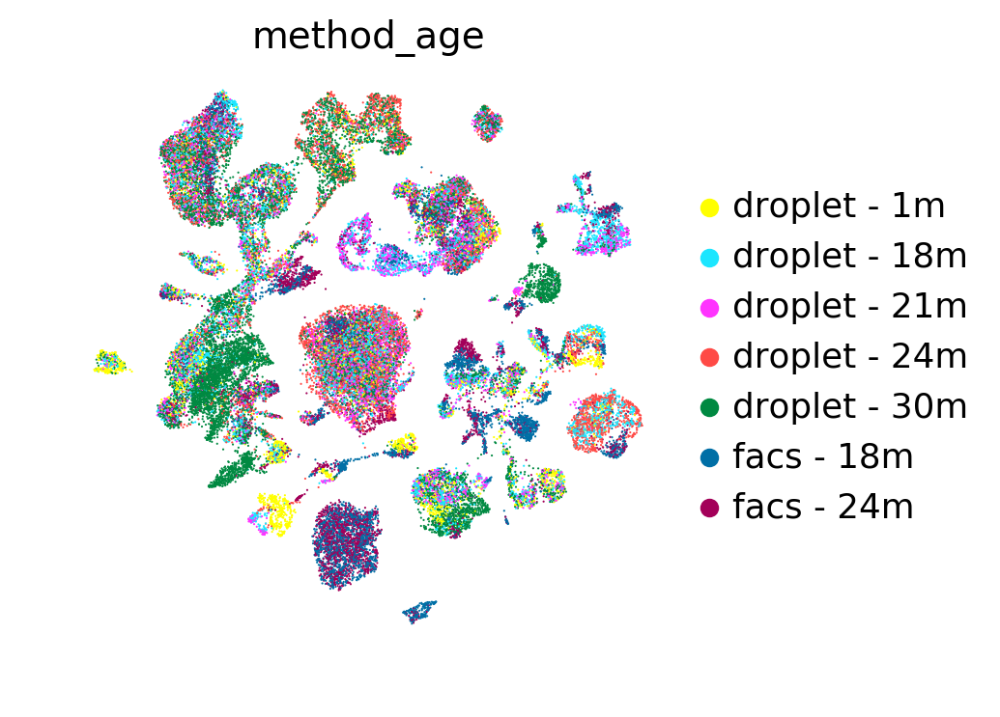

In [34]:
sc.pl.umap(latent_adata, color='method', frameon=False, save='_pretrain_method.pdf')
sc.pl.umap(latent_adata, color='tissue', frameon=False, save='_pretrain_tissue.pdf', palette=sc.pl.palettes.godsnot_102)
sc.pl.umap(latent_adata, color='age', frameon=False, save='_pretrain_age.pdf', palette=sc.pl.palettes.zeileis_28)
sc.pl.umap(latent_adata, color=condition_key, frameon=False, save=f'_pretrain_{condition_key}.pdf', palette=sc.pl.palettes.godsnot_102)

# Perfroming architecture Surgery

In [22]:
new_network = sn.operate(network, 
                         new_conditions=target_conditions,
                         init='Xavier', 
                         freeze=True,
                         freeze_expression_input=False,
                         remove_dropout=False,
                         new_training_kwargs={"beta": 75},
                         new_network_kwargs={"mmd_computation_method": "general"},
                        )

In [23]:
new_network.condition_encoder

{'droplet - 18m': 0,
 'droplet - 1m': 1,
 'droplet - 21m': 2,
 'droplet - 24m': 3,
 'droplet - 30m': 4,
 'facs - 18m': 5,
 'facs - 24m': 6,
 'Microwell-mix': 7,
 'droplet - 3m': 8,
 'facs - 3m': 9}

## Train with small new dataset containing out-of-sample condition

In [24]:
train_adata, valid_adata = sn.utils.train_test_split(target_adata, 0.80)

In [25]:
train_adata.shape, valid_adata.shape

((91508, 5000), (22878, 5000))

In [26]:
new_network.model_path = "./models/CVAE/tabula_senis_mca/after/"

In [27]:
new_network.train(train_adata,
                  valid_adata, 
                  condition_key=condition_key,
                  le=new_network.condition_encoder, 
                  n_epochs=1000,
                  batch_size=512, 
                  early_stop_limit=20,
                  lr_reducer=10, 
                  n_per_epoch=0,
                  save=True,
                  retrain=False,
                  verbose=5)

Model has been successfully restored!


In [28]:
plot_adata = sc.pp.subsample(target_adata, n_obs=50000, copy=True)

In [29]:
encoder_labels, _ = sn.utils.label_encoder(plot_adata, label_encoder=new_network.condition_encoder, condition_key=condition_key)

In [30]:
latent_adata = new_network.to_mmd_layer(plot_adata, encoder_labels, encoder_labels)
latent_adata

AnnData object with n_obs × n_vars = 50000 × 32 
    obs: 'FACS.selection', 'Tech', 'age', 'barcode', 'batch', 'cell', 'cell_ontology_class', 'cell_ontology_id', 'cell_type', 'cell_type_union', 'channel', 'free_annotation', 'log_counts', 'marker_gene', 'method', 'method_age', 'method_tissue', 'mouse.id', 'n_counts', 'n_genes', 'old_tissue', 'percent_mito', 'sample', 'sample_id', 'sex', 'size_factors', 'study', 'subtissue', 'tissue', 'tissue_age', 'tissue_free_annotation'

In [31]:
sc.pp.neighbors(latent_adata)
sc.tl.umap(latent_adata)

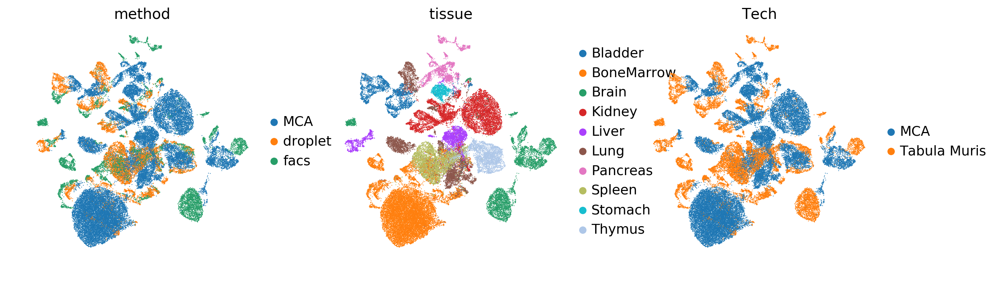

In [32]:
sc.pl.umap(latent_adata, color=['method', 'tissue', 'Tech'], frameon=False)

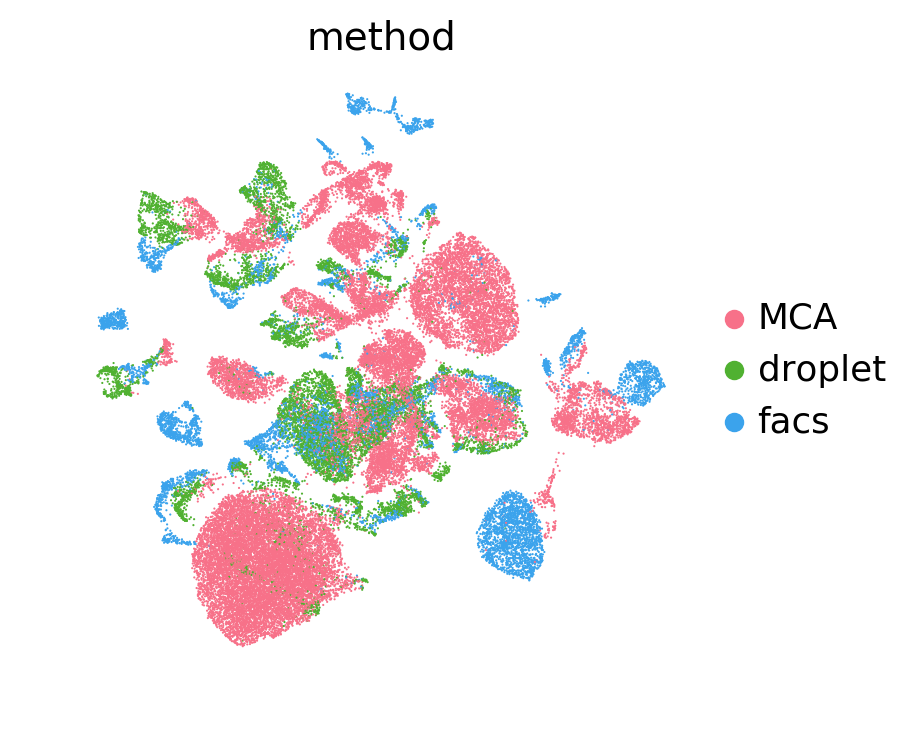

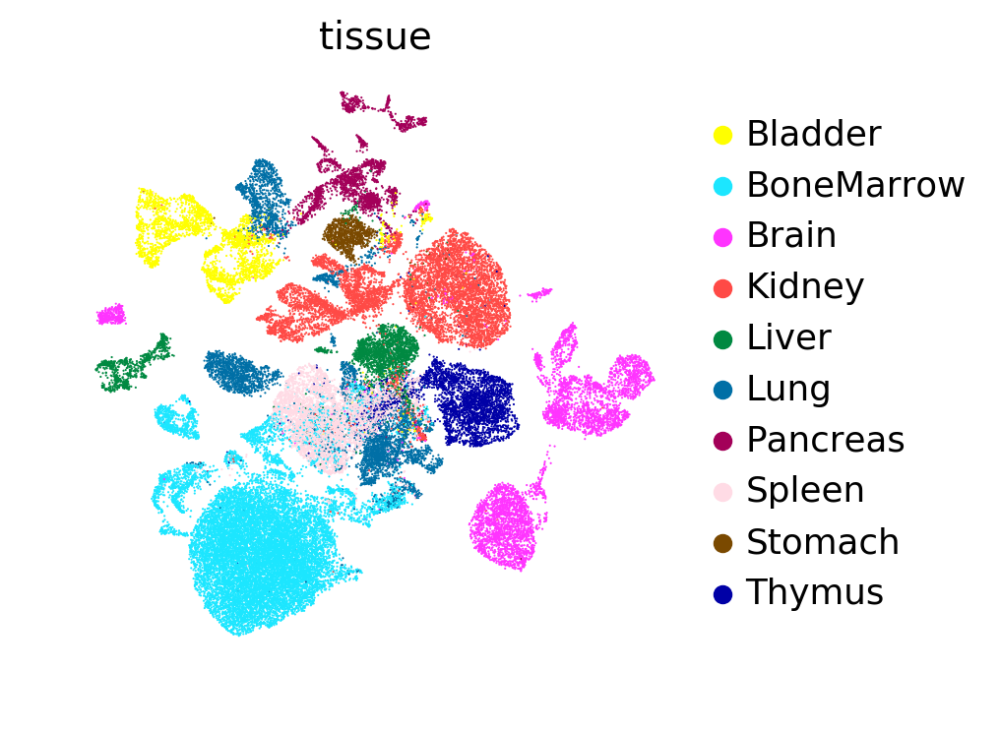

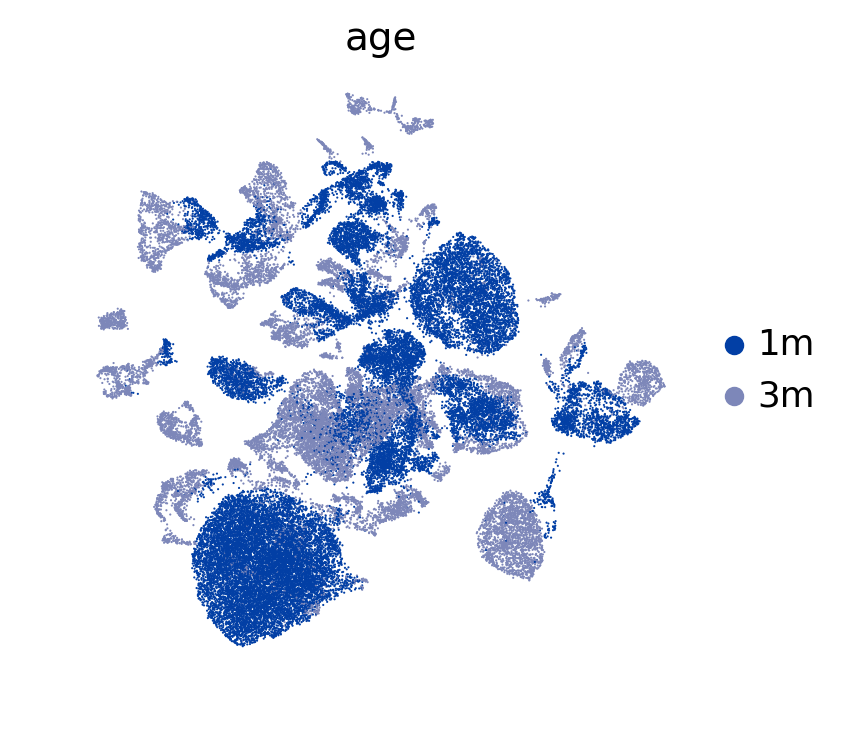

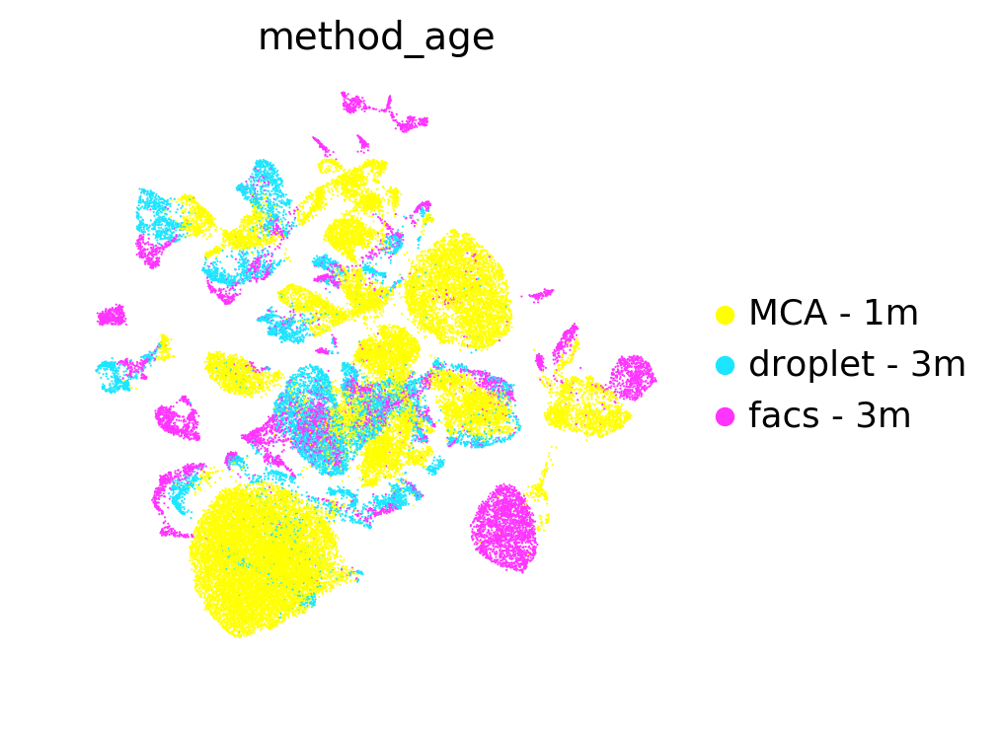

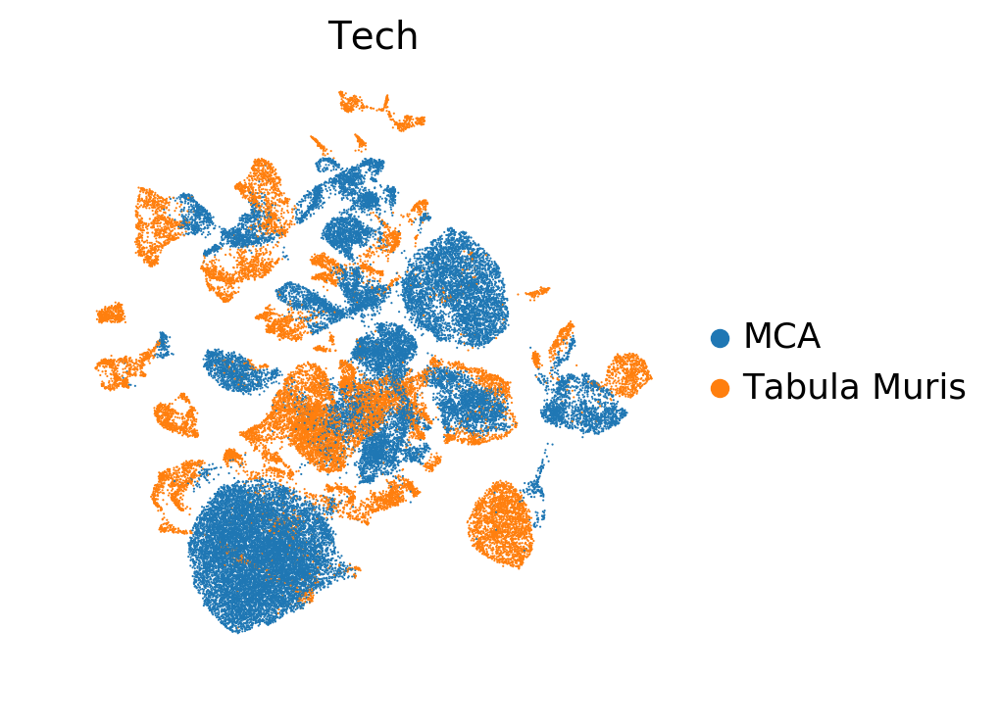

In [33]:
sc.pl.umap(latent_adata, color='method', frameon=False, save='_after_surgery_mca+muris_method.pdf', palette=sns.color_palette('husl', 3))
sc.pl.umap(latent_adata, color='tissue', frameon=False, save='_after_surgery_mca+muris_tissue.pdf', palette=sc.pl.palettes.godsnot_102)
sc.pl.umap(latent_adata, color='age', frameon=False, save='_after_surgery_mca+muris_age.pdf', palette=sc.pl.palettes.zeileis_28)
sc.pl.umap(latent_adata, color=condition_key, frameon=False, save=f'_after_surgery_mca+muris_{condition_key}.pdf', palette=sc.pl.palettes.godsnot_102)
sc.pl.umap(latent_adata, color='Tech', frameon=False, save=f'_after_surgery_mca+muris_Tech.pdf')

In [28]:
plot_adata = sc.pp.subsample(adata, n_obs=250000, copy=True)

In [29]:
encoder_labels, _ = sn.utils.label_encoder(plot_adata, 
                                           label_encoder=new_network.condition_encoder, 
                                           condition_key=condition_key)

In [30]:
latent_adata = new_network.to_mmd_layer(plot_adata, encoder_labels, encoder_labels)
latent_adata

AnnData object with n_obs × n_vars = 250000 × 32 
    obs: 'FACS.selection', 'Tech', 'age', 'barcode', 'batch', 'cell', 'cell_ontology_class', 'cell_ontology_id', 'cell_type', 'cell_type_union', 'channel', 'free_annotation', 'log_counts', 'marker_gene', 'method', 'method_age', 'method_tissue', 'mouse.id', 'n_counts', 'n_genes', 'old_tissue', 'percent_mito', 'sample', 'sample_id', 'sex', 'size_factors', 'study', 'subtissue', 'tissue', 'tissue_age', 'tissue_free_annotation'

In [31]:
latent_adata.obs['label'] = 'Senis - Muris'
latent_adata.obs.loc[latent_adata.obs['Tech'] == 'MCA', 'label'] = 'MCA'

In [32]:
latent_adata.obs['label'].value_counts()

Senis - Muris    187287
MCA               62713
Name: label, dtype: int64

In [33]:
sc.pp.neighbors(latent_adata)
sc.tl.umap(latent_adata)

In [36]:
latent_adata.write_h5ad(os.path.join(base_path, 'tabula_senis_mca/latents/all.h5ad'))

In [37]:
import seaborn as sns

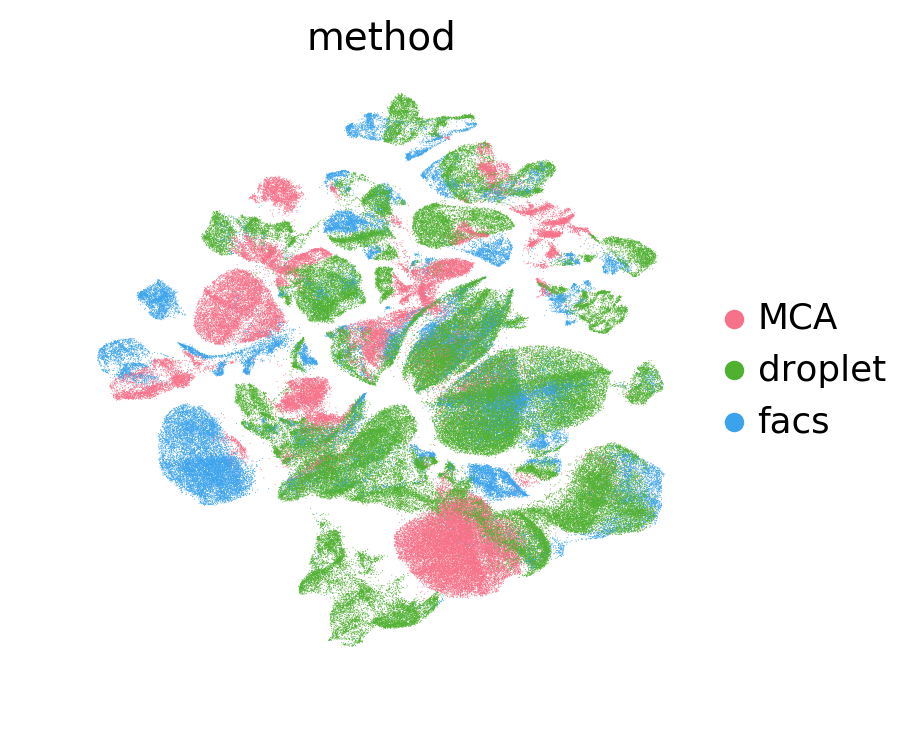

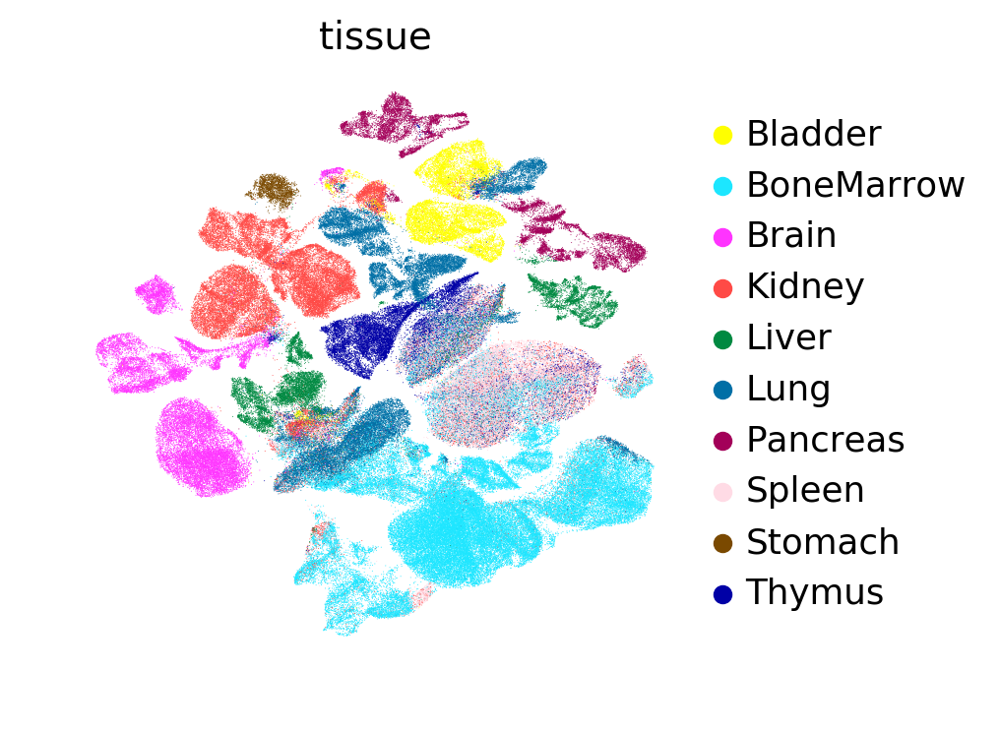

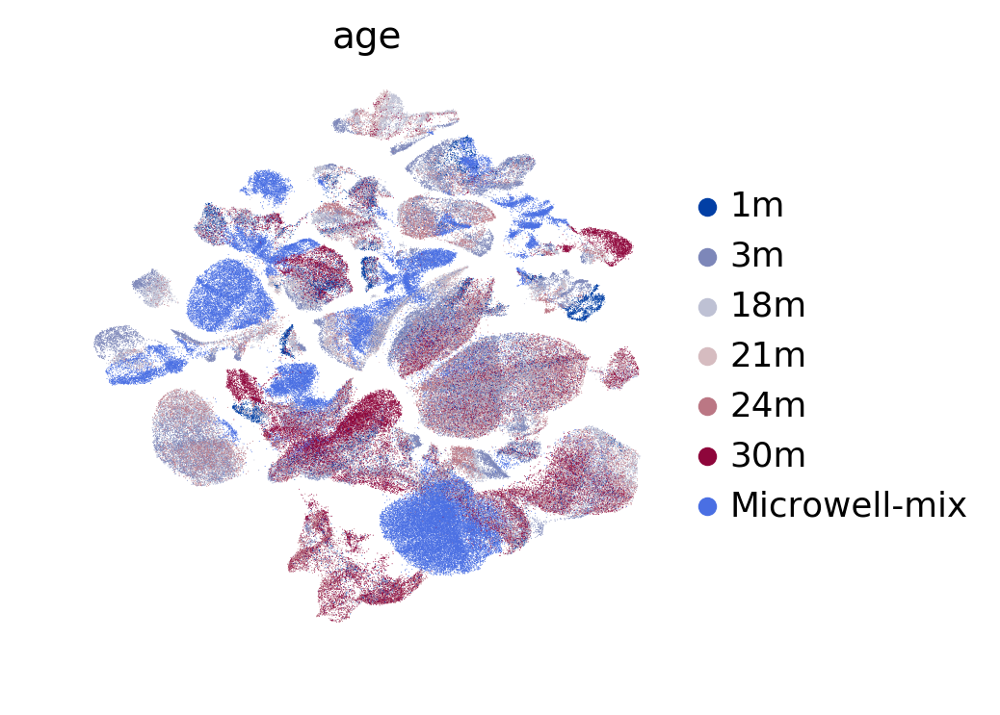

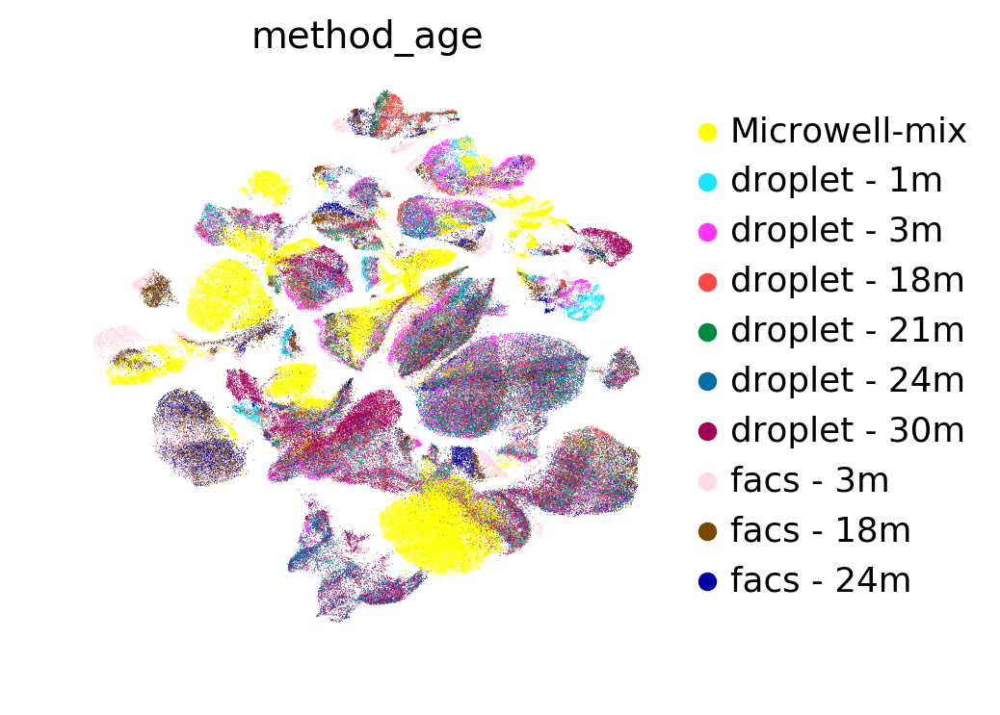

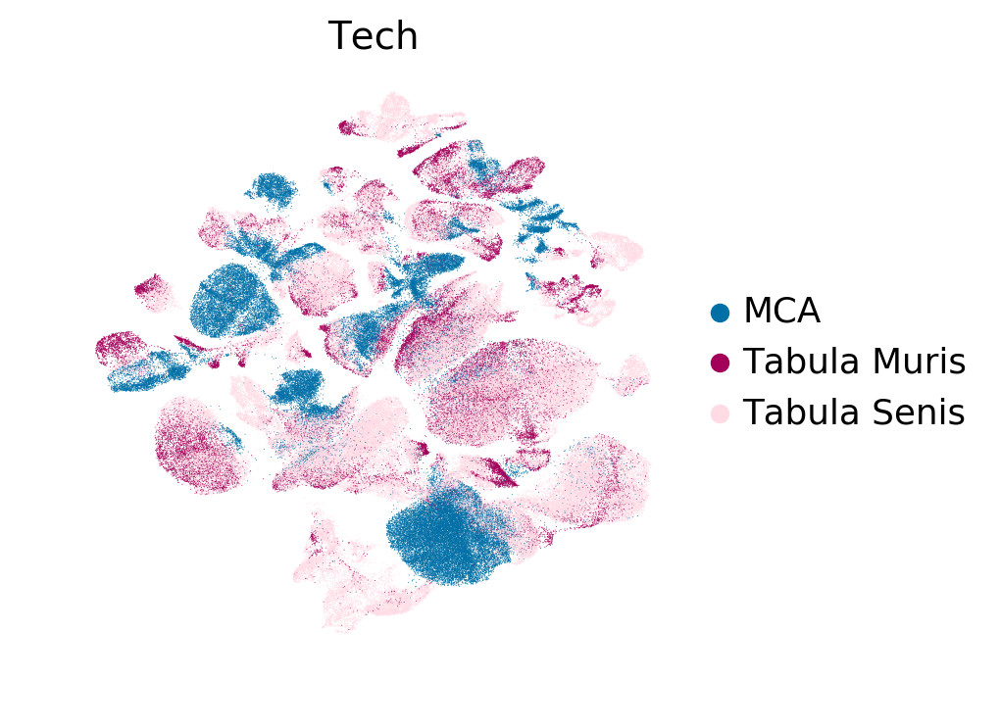

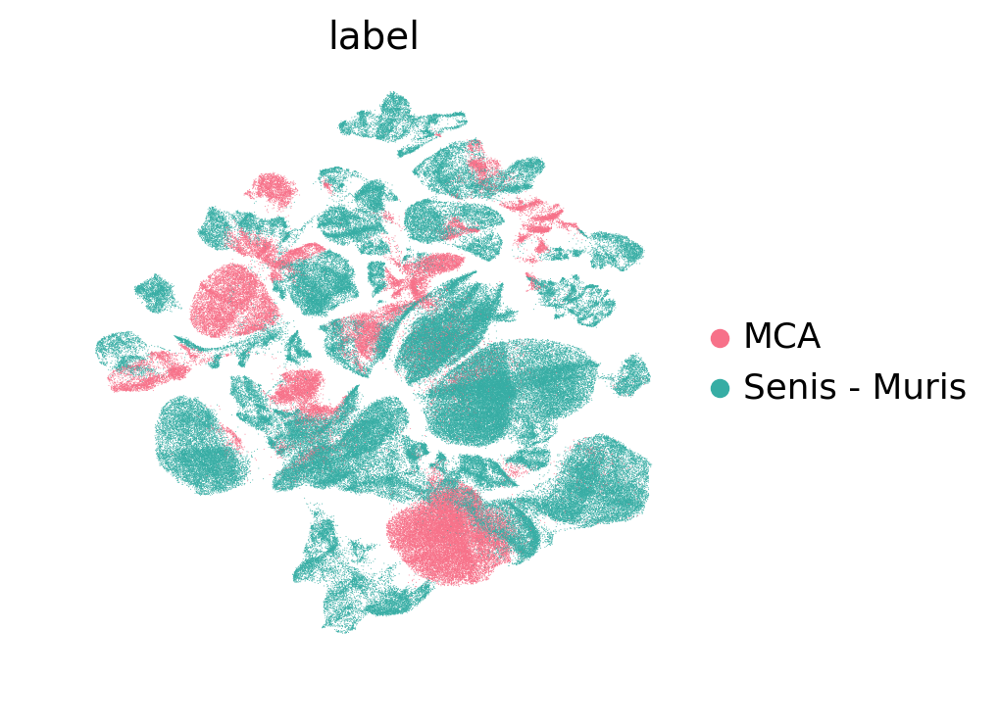

In [40]:
sc.pl.umap(latent_adata, color='method', frameon=False, save='_after_surgery_senis+mca+muris_method.pdf', palette=sns.color_palette('husl', 3))
sc.pl.umap(latent_adata, color='tissue', frameon=False, save='_after_surgery_senis+mca+muris_tissue.pdf', palette=sc.pl.palettes.godsnot_102)
sc.pl.umap(latent_adata, color='age', frameon=False, save='_after_surgery_senis+mca+muris_age.pdf', palette=sc.pl.palettes.zeileis_28)
sc.pl.umap(latent_adata, color=condition_key, frameon=False, save=f'_after_surgery_senis+mca+muris_{condition_key}.pdf', palette=sc.pl.palettes.godsnot_102)
sc.pl.umap(latent_adata, color='Tech', frameon=False, save=f'_after_surgery_senis+mca+muris_Tech.pdf', palette=sc.pl.palettes.godsnot_102[5:])
sc.pl.umap(latent_adata, color='label', frameon=False, save=f'_after_surgery_senis+mca+muris_Label.pdf', palette=sns.color_palette('husl', 2))

# Weighted KNN

In [41]:
n_neighbors = 20
threshold = 0.5

In [42]:
senis_adata = source_adata
muris_adata = adata[adata.obs['Tech'] == 'Tabula Muris']
mca_adata = adata[adata.obs['Tech'] == 'MCA']

In [43]:
train_latent = latent_adata[latent_adata.obs['Tech'] != 'MCA']
valid_latent = latent_adata[latent_adata.obs['Tech'] == 'MCA']

In [44]:
tissues = valid_latent.obs['tissue'].unique().tolist()
tissues

['Spleen',
 'Lung',
 'Kidney',
 'BoneMarrow',
 'Pancreas',
 'Liver',
 'Bladder',
 'Thymus',
 'Stomach',
 'Brain']

## Cell type prediction

In [45]:
pred_labels, uncertainties = sn.utils.weighted_knn(train_latent, 
                                                   valid_latent, 
                                                   cell_type_key, 
                                                   n_neighbors=n_neighbors, 
                                                   threshold=threshold, 
                                                   pred_unknown=True, 
                                                   return_uncertainty=True,
                                                   )

Weighted KNN with n_neighbors = 20 and threshold = 0.5 ... finished!


In [46]:
true_labels = np.array(valid_latent.obs[cell_type_key].values).reshape(-1, 1)

labels_eval = pred_labels == true_labels
labels_eval = labels_eval.astype(object)

n_correct = len(labels_eval[labels_eval == True])
n_incorrect = len(labels_eval[labels_eval == False]) - len(labels_eval[pred_labels == 'Unknown'])
n_unknown = len(labels_eval[pred_labels == 'Unknown'])

labels_eval[labels_eval == True] = f'Correct ({n_correct})'
labels_eval[labels_eval == False] = f'InCorrect ({n_incorrect})'
labels_eval[pred_labels == 'Unknown'] = f'Unknown ({n_unknown})'

labels_eval_key = f'celltype_evaluation_w_unknown_{n_neighbors}_{threshold}'
uncertainty_key = f'celltype_uncertainty_w_unknown_{n_neighbors}_{threshold}'
pred_labels_key = f'predicted_celltype_w_unknown_{n_neighbors}_{threshold}'

valid_latent.obs[labels_eval_key] = pd.Categorical(labels_eval.reshape(-1, ))
valid_latent.obs[uncertainty_key] = uncertainties
valid_latent.obs[pred_labels_key] = pd.Categorical(pred_labels.reshape(-1, ))

Trying to set attribute `.obs` of view, copying.


## Tissue Prediction

In [47]:
pred_labels, uncertainties = sn.utils.weighted_knn(train_latent, 
                                                   valid_latent, 
                                                   'tissue', 
                                                   n_neighbors=n_neighbors, 
                                                   threshold=threshold, 
                                                   pred_unknown=True, 
                                                   return_uncertainty=True,
                                                   )

Weighted KNN with n_neighbors = 20 and threshold = 0.5 ... finished!


In [84]:
true_labels = np.array(valid_latent.obs['tissue'].values).reshape(-1, 1)

labels_eval = pred_labels == true_labels
labels_eval = labels_eval.astype(object)

n_correct = len(labels_eval[labels_eval == True])
n_incorrect = len(labels_eval[labels_eval == False]) - len(labels_eval[pred_labels == 'Unknown'])
n_unknown = len(labels_eval[pred_labels == 'Unknown'])

labels_eval[labels_eval == True] = f'Correct ({n_correct})'
labels_eval[labels_eval == False] = f'InCorrect ({n_incorrect})'
labels_eval[pred_labels == 'Unknown'] = f'Unknown ({n_unknown})'

labels_eval_key = f'tissue_evaluation_w_unknown_{n_neighbors}_{threshold}'
uncertainty_key = f'tissue_uncertainty_w_unknown_{n_neighbors}_{threshold}'
pred_labels_key = f'predicted_tissue_w_unknown_{n_neighbors}_{threshold}'

valid_latent.obs[labels_eval_key] = pd.Categorical(labels_eval.reshape(-1, ))
valid_latent.obs[uncertainty_key] = uncertainties
valid_latent.obs[pred_labels_key] = pd.Categorical(pred_labels.reshape(-1, ))

In [85]:
valid_latent.obs.to_csv("./results/classification/tabula_senis_mca/senis+muris_to_mca.csv", index=None)

In [52]:
import seaborn as sns
from matplotlib import pyplot as plt

In [56]:
results_df = pd.DataFrame(columns=['tissue', 'k', 'prob', 'Correct', 'InCorrect', 'Unknown'])
for tissue in tissues:
#     print(f"{tissue} ...", end=' ')
    tissue_obs = valid_latent[valid_latent.obs['tissue'] == tissue].obs
    n_samples = tissue_obs.shape[0]
    
    new_row = {"k": n_neighbors, "prob": threshold, 'tissue': f'{tissue}({n_samples})'}

   

    labels_eval_key = f'predicted_celltype_w_unknown_{n_neighbors}_{threshold}'

    pred_labels = tissue_obs[labels_eval_key].values
    true_labels = tissue_obs[cell_type_key].values

    labels_eval = np.array(pred_labels) == np.array(true_labels)

    n_correct = len(labels_eval[labels_eval == True])
    n_incorrect = len(labels_eval[labels_eval == False]) - len(labels_eval[pred_labels == 'Unknown'])
    n_unknown = len(labels_eval[pred_labels == 'Unknown'])

    new_row['Correct'] = n_correct
    new_row['InCorrect'] = n_incorrect
    new_row['Unknown'] = n_unknown

    results_df = results_df.append(new_row, ignore_index=True)

In [57]:
color_palette = sns.color_palette("cubehelix", 3)

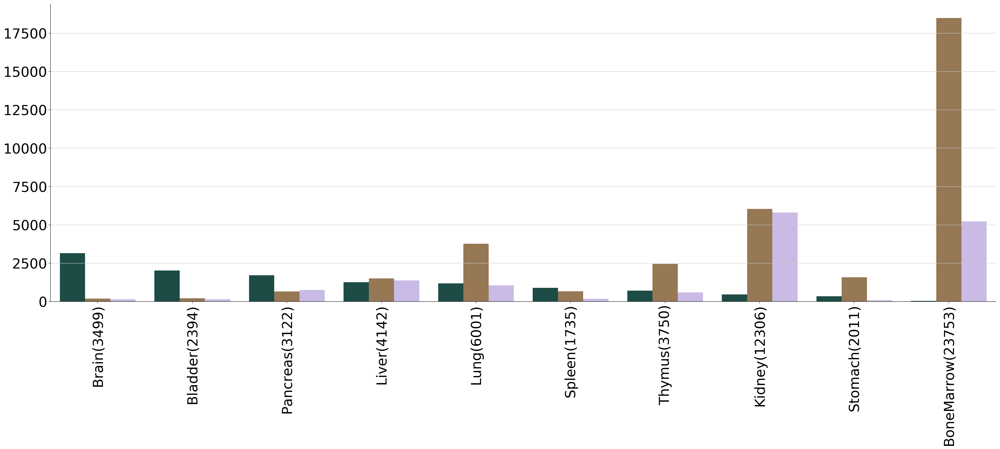

In [58]:
results_df = results_df.sort_values('Correct', ascending=False)
results_df_melted = pd.melt(results_df, id_vars=['k', 'prob', 'tissue'], var_name='type', value_name='n_samples')
barplot = sns.catplot(x='tissue', y='n_samples', hue='type', data=results_df_melted, 
                      kind='bar', height=10, aspect=3, legend=False, palette=color_palette)


plt.xticks(rotation=90, fontsize=30)
plt.yticks(fontsize=30)
plt.ylabel("")
plt.xlabel("")
plt.savefig(f"./results/classification/tabula_senis_mca/barplot_tissues_celltype_classification.pdf", bbox_inches='tight')
# results_df.to_csv("./results/classification/tabula_senis_mca/table_tissues.csv", index=None)
plt.show()
plt.close()

In [64]:
results_df = pd.DataFrame(columns=['tissue', 'k', 'prob', 'Correct', 'InCorrect', 'Unknown'])
for tissue in tissues:
#     print(f"{tissue} ...", end=' ')
    tissue_obs = valid_latent[valid_latent.obs['tissue'] == tissue].obs
    n_samples = tissue_obs.shape[0]
    
    new_row = {"k": n_neighbors, "prob": threshold, 'tissue': f'{tissue}({n_samples})'}

    labels_eval_key = f'predicted_tissue_w_unknown_{n_neighbors}_{threshold}'

    pred_labels = tissue_obs[labels_eval_key].values
    true_labels = tissue_obs['tissue'].values

    labels_eval = np.array(pred_labels) == np.array(true_labels)

    n_correct = len(labels_eval[labels_eval == True])
    n_incorrect = len(labels_eval[labels_eval == False]) - len(labels_eval[pred_labels == 'Unknown'])
    n_unknown = len(labels_eval[pred_labels == 'Unknown'])

    new_row['Correct'] = n_correct
    new_row['InCorrect'] = n_incorrect
    new_row['Unknown'] = n_unknown

    results_df = results_df.append(new_row, ignore_index=True)

In [65]:
results_df

,tissue,k,prob,Correct,InCorrect,Unknown
0,Spleen(1735),20,0.5,1316,141,278
1,Lung(6001),20,0.5,4424,654,923
2,Kidney(12306),20,0.5,3424,4424,4458
3,BoneMarrow(23753),20,0.5,22110,1150,493
4,Pancreas(3122),20,0.5,1133,1040,949
5,Liver(4142),20,0.5,1599,978,1565
6,Bladder(2394),20,0.5,1932,259,203
7,Thymus(3750),20,0.5,3286,275,189
8,Stomach(2011),20,0.5,0,1937,74
9,Brain(3499),20,0.5,3413,47,39


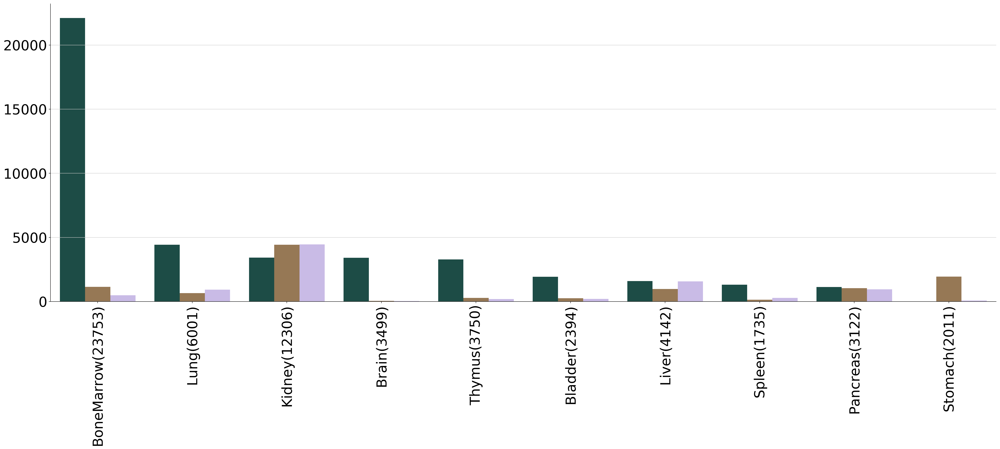

In [66]:
results_df = results_df.sort_values('Correct', ascending=False)
results_df_melted = pd.melt(results_df, id_vars=['k', 'prob', 'tissue'], var_name='type', value_name='n_samples')
barplot = sns.catplot(x='tissue', y='n_samples', hue='type', data=results_df_melted, 
                      kind='bar', height=10, aspect=3, legend=False, palette=color_palette)


plt.xticks(rotation=90, fontsize=30)
plt.yticks(fontsize=30)
plt.ylabel("")
plt.xlabel("")
plt.savefig(f"./results/classification/tabula_senis_mca/barplot_tissues_tissue_classification.pdf", bbox_inches='tight')
# results_df.to_csv("./results/classification/tabula_senis_mca/table_tissues.csv", index=None)
plt.show()
plt.close()

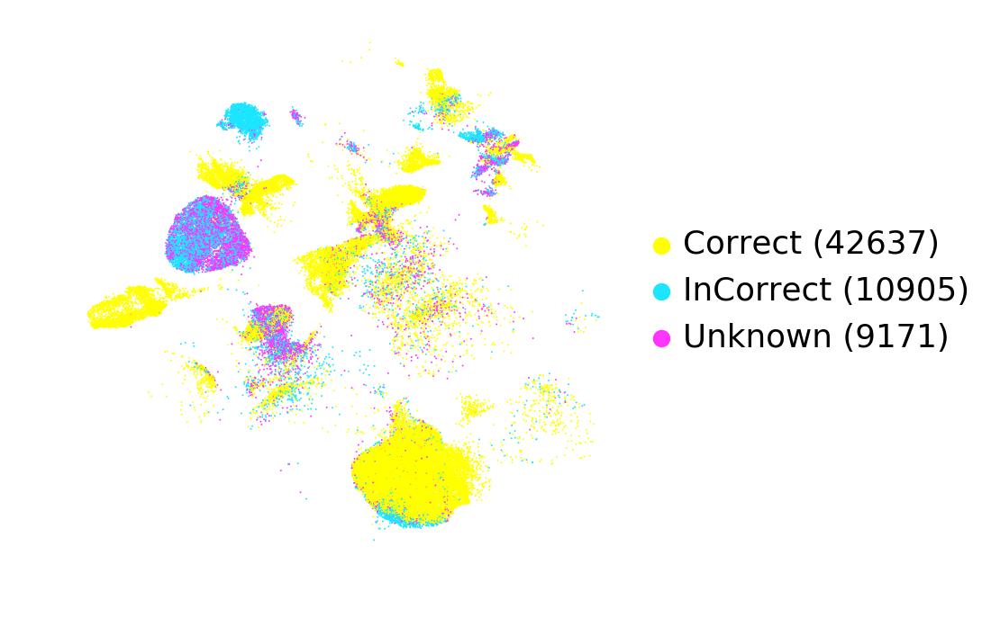

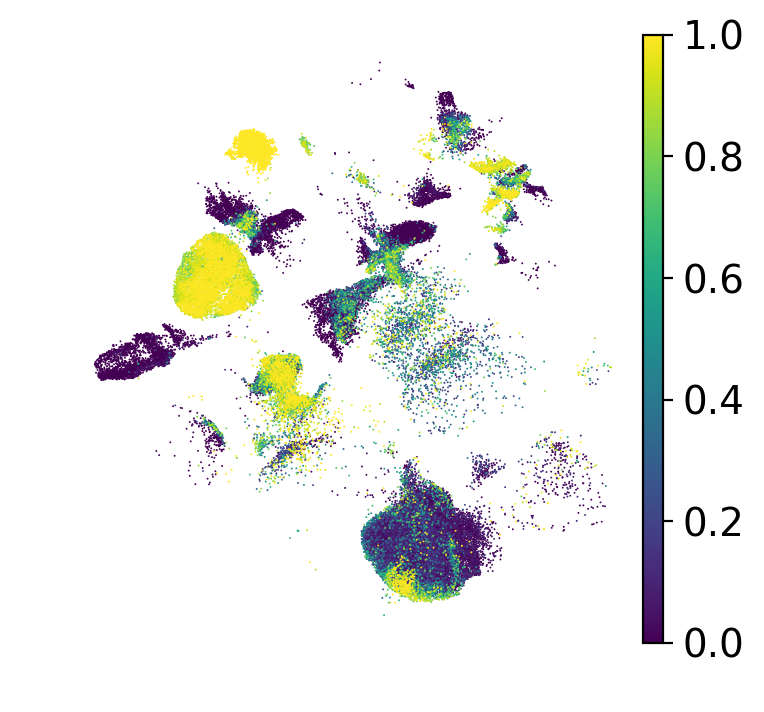

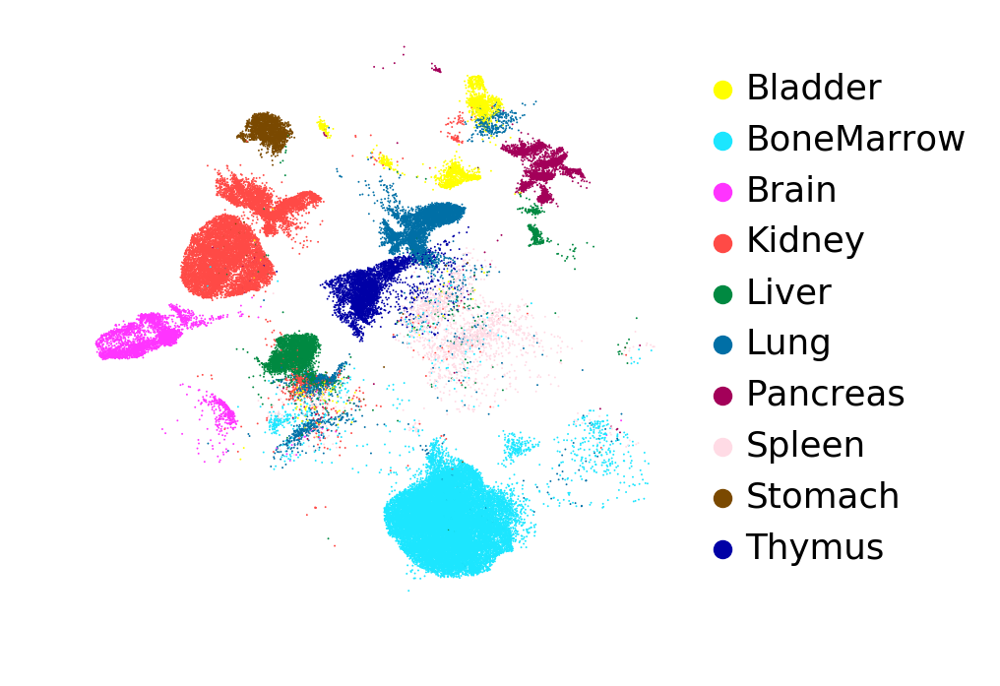

In [86]:
labels_key = f'tissue_evaluation_w_unknown_{n_neighbors}_{threshold}'
uncertainty_key = f'tissue_uncertainty_w_unknown_{n_neighbors}_{threshold}'

sc.pl.umap(valid_latent, color=labels_key, save=f'_tissue_eval_with_unknown_{n_neighbors}_{threshold}.pdf',
   frameon=False, title='', show=True, palette=sc.pl.palettes.godsnot_102)

sc.pl.umap(valid_latent, color=uncertainty_key, save=f'_tissue_uncertainty_with_unknown_{n_neighbors}_{threshold}.pdf',
           frameon=False, title='', show=True)

sc.pl.umap(valid_latent, color='tissue', save='_tissue_mca.pdf',
           frameon=False, title='', show=True, palette=sc.pl.palettes.godsnot_102)

sc.pl.violin(valid_latent, groupby=labels_key, keys=uncertainty_key, show=False,
             rotation=45, jitter=False, save=f'_tissue_uncertainty_w_unknown_{n_neighbors}_{threshold}.pdf')

In [88]:
latent_adata.obs.groupby(['tissue', 'Tech']).size()

tissue      Tech        
Bladder     MCA              2394
            Tabula Muris     3353
            Tabula Senis     6633
BoneMarrow  MCA             23753
            Tabula Muris     7562
            Tabula Senis    40647
Brain       MCA              3499
            Tabula Muris     6967
            Tabula Senis    11187
Kidney      MCA             12306
            Tabula Muris     2488
            Tabula Senis    18177
Liver       MCA              4142
            Tabula Muris     1545
            Tabula Senis     7421
Lung        MCA              6001
            Tabula Muris     4387
            Tabula Senis    21898
Pancreas    MCA              3122
            Tabula Muris     1394
            Tabula Senis     6963
Spleen      MCA              1735
            Tabula Muris     7796
            Tabula Senis    27097
Stomach     MCA              2011
            Tabula Muris        0
            Tabula Senis        0
Thymus      MCA              3750
            Tabula Muri

In [91]:
sc.settings.figdir = 'results/integration/tabula_senis_mca/tissue_umaps/'

Trying to set attribute `.uns` of view, copying.


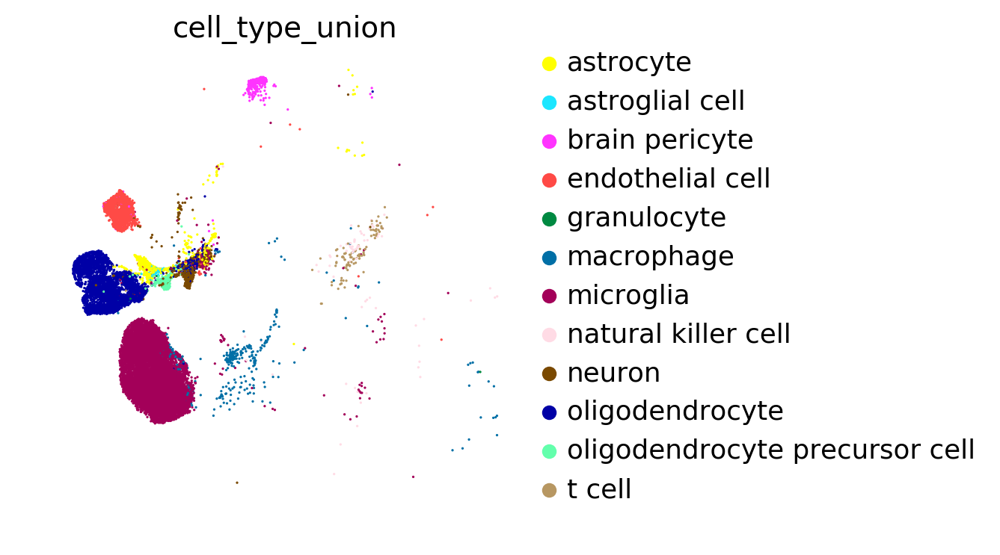

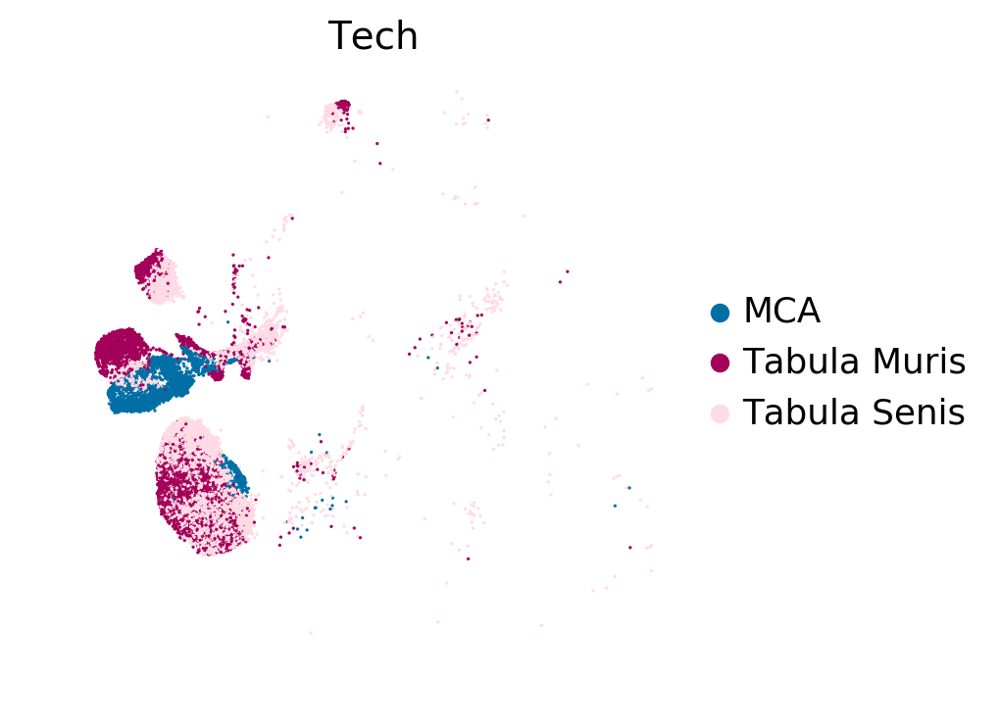

Brain


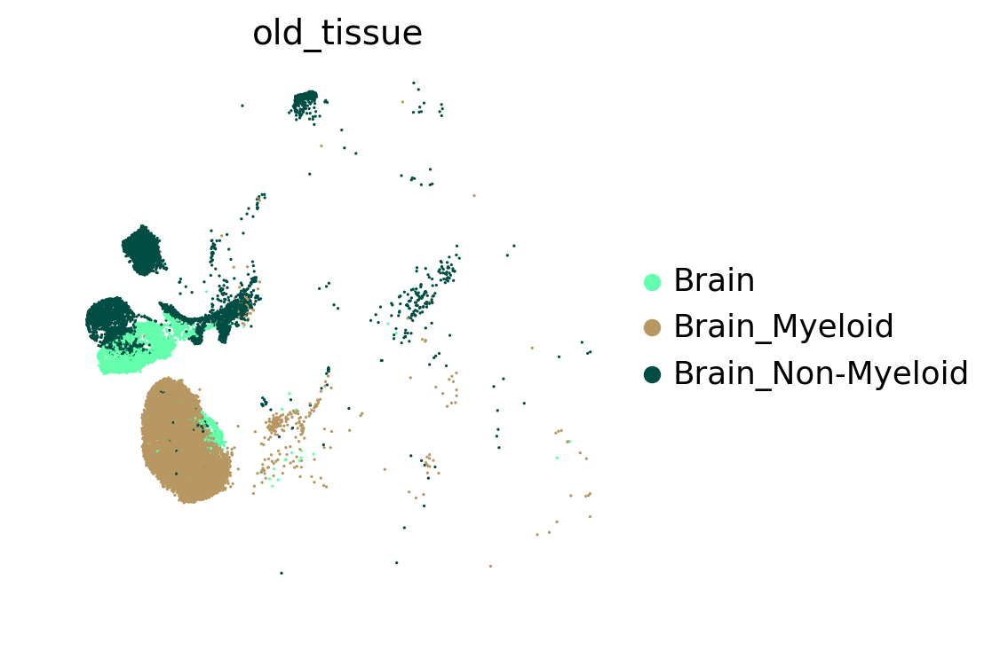

In [99]:
for tissue in ['Brain']:
    tissue_adata = latent_adata[latent_adata.obs['tissue'] == tissue]
    
    
    sc.pl.umap(tissue_adata, color='cell_type_union', 
               show=True, frameon=False, save=f'_{tissue}_cell_type.pdf', palette=sc.pl.palettes.godsnot_102)
    sc.pl.umap(tissue_adata, color='Tech', 
               show=True, frameon=False, save=f'_{tissue}_tech.pdf', palette=sc.pl.palettes.godsnot_102[5:])
    
    if len(tissue_adata.obs['old_tissue'].unique().tolist()) > 1:
        print(tissue)
        sc.pl.umap(tissue_adata, color='old_tissue', palette=sc.pl.palettes.godsnot_102[10:],
                   show=True, frameon=False, save=f'_{tissue}_old_tissue.pdf')